In [1]:
import unirest
import os
import pandas as pd
from ast import literal_eval
import matplotlib.pyplot as plt
import json
from scipy.spatial import distance
from sklearn import preprocessing
import numpy as np
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In this notebook I will try to collect data for [Systembolaget](https://en.wikipedia.org/wiki/Systembolaget), "a government owned chain of liquor stores in Sweden, which is the only retail store allowed to sell alcoholic beverages". 

Link to store: https://www.systembolaget.se/sok-dryck/?fullassortment=0

After that I download bottles images and try to find some with unusual shapes.

In [2]:
#set to True for data downloading
download_data = False

Get data from Mashape SystemetAPI https://market.mashape.com/karlroos/systemet# (API key needed) with ```unirest``` library.

In [3]:
mashape_key = 'PjtL1bPycxmsh0O24T70mBWso9gEp16mVYkjsn2gbdFskslV6g'
response = unirest.get("https://karlroos-systemet.p.mashape.com/product?alcohol_from=0.4&limit=50",
  headers={
    "X-Mashape-Key": mashape_key,
    "Accept": "application/json"
  }
)

In [4]:
response.body[0]

{u'alcohol': 0.5,
 u'apk': 0.39,
 u'article_id': u'733236',
 u'country': {u'id': u'4', u'name': u'USA'},
 u'country_id': u'4',
 u'deleted_at': None,
 u'ecological': False,
 u'id': u'8',
 u'koscher': False,
 u'name': u'Balcones True Blue',
 u'name_2': u'',
 u'origin': None,
 u'origin_id': None,
 u'price': 899,
 u'price_per_liter': 1284.29,
 u'product_number': u'1005201',
 u'start_date': u'2013-03-01',
 u'tags': [],
 u'volume': 0.7,
 u'year': u'0'}

In [5]:
if os.path.isfile('data.csv') and not download_data:
    sdf = pd.read_csv('data.csv', sep='\t', encoding='utf-8')
else:
    offset = 0
    json_data = []
    
    while response.body and response.code == 200:
        url = "https://karlroos-systemet.p.mashape.com/product?limit=50&offset=%s" % offset
        response = unirest.get(url, headers={
            "X-Mashape-Key": mashape_key,
            "Accept": "application/json"
          }
        )
        for rli in response.body:
            json_data.append(rli)
        offset += 50
        sleep(15)
    
    data = literal_eval(str(json_data))
    sdf = pd.DataFrame(data) 
    sdf.to_csv('data.csv', sep='\t', encoding='utf-8')

In [6]:
sdf[0:3]

,Unnamed: 0,alcohol,apk,article_id,country,country_id,deleted_at,ecological,id,koscher,...,name_2,origin,origin_id,price,price_per_liter,product_number,start_date,tags,volume,year
0,0,0.40,0.63,25053,"{u'id': u'1', u'name': u'Frankrike'}",1,NaN,False,1,False,...,NaN,"{u'id': u'8548197', u'name': u'Cognac'}",8548197,442,631.43,10001,2000-08-07,"[{u'id': u'1', u'name': u'cognac'}]",0.7,0
1,1,0.38,1.33,190719,"{u'id': u'2', u'name': u'Sverige'}",2,NaN,False,2,False,...,NaN,NaN,NaN,197,281.43,1001,2006-04-01,"[{u'id': u'2', u'name': u'liquor'}]",0.7,0
2,2,0.38,1.37,51029,"{u'id': u'3', u'name': u'Polen'}",3,NaN,False,3,False,...,NaN,NaN,NaN,192,274.29,1001201,2004-12-06,"[{u'id': u'2', u'name': u'liquor'}]",0.7,0


In [7]:
%%time

#get type from tags
def fullname_from_tags(tags):
    zipped_tags = []
    for t in tags:
        if t['name']:
            zipped_tags.append((int(t['id']), t['name']))
    zipped_tags = sorted(zipped_tags)
    if len(zipped_tags) == 0:
        return ''
    else:
        return ' '.join(zip(*zipped_tags)[1])

sdf['type'] = np.array(['']*len(sdf))
for index, row in sdf.iterrows():
    js_str = row['tags'].replace('\'', '\"').replace('u', '')
    json_result = json.loads(js_str)
    sdf.set_value(index, 'type', fullname_from_tags(json_result))

Wall time: 2.38 s


In [8]:
sdf[1000:1003][['tags','type']]

,tags,type
1000,"[{u'id': u'20', u'name': u'wine'}]",wine
1001,"[{u'id': u'23', u'name': u'red-wine'}, {u'id':...",wine red-wine
1002,"[{u'id': u'23', u'name': u'red-wine'}, {u'id':...",wine red-wine


In [9]:
sdf.describe()

,Unnamed: 0,alcohol,apk,article_id,country_id,deleted_at,ecological,id,koscher,origin_id,price,price_per_liter,product_number,volume,year
count,25547.000,25547.000000,25547.00000,25547.000000,25547.000000,0,25547,25547.000000,25547,20535.000000,25547.000000,25547.000000,2.554700e+04,25547.000000,25547.000000
mean,12773.000,0.180467,0.64030,726578.915372,11.615924,NaN,0.0614162,13566.173210,0.000430579,10038782.017482,448.493216,589.137320,7.257558e+06,0.873808,1232.947743
std,7374.928,0.133038,0.39765,269337.829602,13.368167,NaN,0.240097,7798.935227,0.0207463,2034045.654927,1277.235647,1643.509063,1.042773e+07,1.685613,978.192557
min,0.000,0.010000,0.01000,1.000000,1.000000,NaN,False,1.000000,False,37943.000000,7.800000,15.500000,1.010000e+02,0.060000,0.000000
25%,6386.500,0.120000,0.34000,630019.500000,2.000000,NaN,0,6784.500000,0,10347243.500000,99.000000,132.000000,7.118351e+06,0.700000,0.000000
50%,12773.000,0.140000,0.58000,804030.000000,6.000000,NaN,0,13421.000000,0,10995778.000000,189.000000,252.000000,7.726801e+06,0.750000,2007.000000
75%,19159.500,0.150000,0.85000,921964.500000,15.000000,NaN,0,20481.500000,0,11005862.500000,401.000000,532.000000,8.696951e+06,0.750000,2012.000000
max,25546.000,0.750000,3.87000,1046023.000000,106.000000,NaN,True,26907.000000,True,11018158.000000,49851.000000,61285.710000,9.996520e+08,30.000000,2015.000000


So, this dataset consist of 25547 alcholol drinks. Let's find some extreme among them:

In [10]:
#strongest drinks
sdf[sdf.alcohol == sdf.alcohol.max()][['alcohol', 'name', 'origin', 'tags']]

,alcohol,name,origin,tags
10767,0.75,Society Single Cask Rum,"{u'id': u'9424177', u'name': u'Skottland'}","[{u'id': u'3', u'name': u'whisky'}, {u'id': u'..."
22507,0.75,Strane,NaN,"[{u'id': u'10', u'name': u'gin'}]"


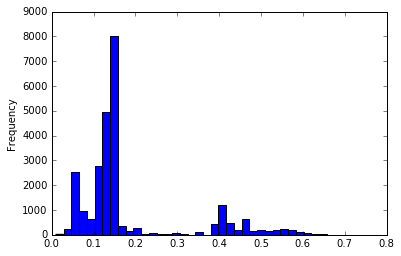

In [11]:
sdf.alcohol.plot(kind='hist', bins=40)
plt.show()

In [12]:
#most expensive
sdf[sdf.price > sdf.price.max()*0.8][['alcohol', 'name', 'origin', 'type', 'price', 'year', 'volume']]

,alcohol,name,origin,type,price,year,volume
10628,0.40,Glen Grant,"{u'id': u'10996528', u'name': u'Skottland'}",whisky malt,41677,1951,0.7
11940,0.46,Highland Park,"{u'id': u'11007524', u'name': u'Skottland'}",whisky malt,40994,1968,0.7
21218,0.13,Armand de Brignac,"{u'id': u'11006405', u'name': u'Champagne'}",wine dry sparkling white-wine,49851,0,6.0
22520,0.44,BenRiach Vestige Cask 2381,"{u'id': u'6919779', u'name': u'Skottland, High...",whisky malt,42900,1966,0.7
25189,0.58,Port Ellen,"{u'id': u'11004510', u'name': u'Skottland'}",whisky malt,49530,1982,1.5


In [13]:
sdf[sdf.price_per_liter > sdf.price_per_liter.max()*0.9][['alcohol', 'name', 'origin', 'tags', 'price', 'year','price_per_liter']]

,alcohol,name,origin,tags,price,year,price_per_liter
10628,0.40,Glen Grant,"{u'id': u'10996528', u'name': u'Skottland'}","[{u'id': u'3', u'name': u'whisky'}, {u'id': u'...",41677,1951,59538.57
11940,0.46,Highland Park,"{u'id': u'11007524', u'name': u'Skottland'}","[{u'id': u'3', u'name': u'whisky'}, {u'id': u'...",40994,1968,58562.86
22520,0.44,BenRiach Vestige Cask 2381,"{u'id': u'6919779', u'name': u'Skottland, High...","[{u'id': u'3', u'name': u'whisky'}, {u'id': u'...",42900,1966,61285.71


In [14]:
#largest
sdf_largest = sdf[sdf.volume == sdf.volume.max()][['alcohol', 'volume', 'tags', 'name']]
print len(sdf_largest)
sdf_largest[0:3]

68


,alcohol,volume,tags,name
3349,0.05,30,"[{u'id': u'6', u'name': u'beer'}, {u'id': u'7'...",Old Speckled Hen
3914,0.05,30,"[{u'id': u'6', u'name': u'beer'}, {u'id': u'19...",Stella Artois
3915,0.05,30,"[{u'id': u'6', u'name': u'beer'}, {u'id': u'19...",Spaten


Correlation matrix (only price vs price_per_liter demonstrate high value):

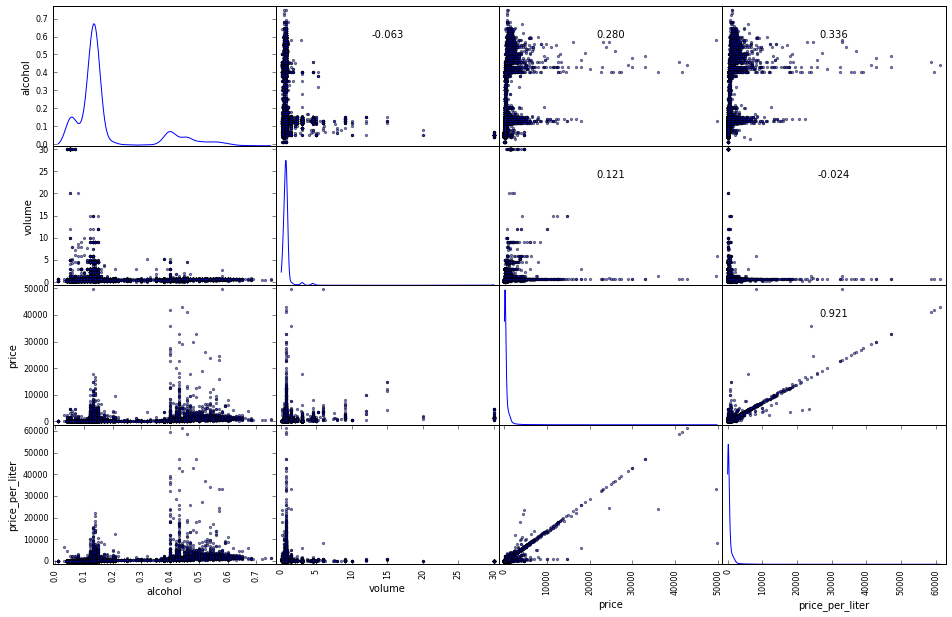

In [15]:
axes = pd.scatter_matrix(sdf[['alcohol', 'volume', 'price', 'price_per_liter']], alpha=0.5, figsize=(16, 10), diagonal='kde')
corr = sdf[['alcohol', 'volume', 'price', 'price_per_liter']].corr().as_matrix()
for i, j in zip(*plt.np.triu_indices_from(axes, k=1)):
    axes[i, j].annotate("%.3f" %corr[i,j], (0.5, 0.8), xycoords='axes fraction', ha='center', va='center')
plt.show()

All possible types:

In [16]:
tags = set()
for r in sdf.iterrows():
    js_str = r[1]['tags'].replace('\'', '\"').replace('u', '')
    json_result = json.loads(js_str)
    for t in json_result:
        tags.add(t["name"])

print len(tags)
print tags

34
set([u'lager', u'mlled-wine', u'vermoth', u'pnsch', u'sweet', u'ale', u'red-wine', u'jenever', u'sake', u'rose', u'teqila', u'sparkling', u'beer', u'cognac', u'calvados', u'rm', u'bitter', u'non-alcohol', u'borbon', u'stot', u'liqor', u'sherry', u'brandy', u'gin', u'apertif', u'whisky', u'dry', u'white-wine', u'malt', u'cider', u'armegnac', u'mead', u'grappa', u'wine'])


# Systembolaget bottles data 

Next I will download images from Systembolaget site, but there is one difficulty. For construct liquier item URL its category should be known, e.g 'vita-viner' in https://www.systembolaget.se/dryck/vita-viner/bramito-del-cervo-7476301. This categories are in Swedish and I will create dictionary manually:

In [17]:
category = {u'ale':'ol',
 u'beer':'ol',
 u'bitter':'ol',
 u'brandy':'sprit',
 u'calvados':'sprit',
 u'cider':'cider-och-blanddrycker',
 u'cognac':'sprit',
 u'gin':'sprit',
 u'grappa':'sprit',
 u'lager':'ol',
 u'mead':'cider-och-blanddrycker',
 u'red-wine':'roda-viner',
 u'rose':'roseviner',
 u'sake':'aperitif-dessert',
 u'sherry':'sprit',
 u'sparkling':'mousserande-viner',
 u'teqila':'sprit',
 u'vermoth':'aperitif-dessert',
 u'whisky':'sprit',
 u'white-wine':'vita-viner',
 u'wine':'roda-viner'}

other=('aperitif-dessert', 'alkoholfritt', 'mousserande-viner')

all_cat = set(zip(*category.items())[1] + other)

In [18]:
all_cat

{'alkoholfritt',
 'aperitif-dessert',
 'cider-och-blanddrycker',
 'mousserande-viner',
 'ol',
 'roda-viner',
 'roseviner',
 'sprit',
 'vita-viner'}

In [19]:
%%time
from random import randint
import time

basesmt = 'https://www.systembolaget.se/dryck/'
blessed = []

wait_iter = 10
max_without_wait = 20
delay = 3
max_delay = 20

start = time.time()
strike = 0

#collect html pages
if download_data:
    for r in log_progress(range(len(df))):    
        row = df.ix[r]
        url = basesmt
        js_str = row['tags'].replace('\'', '\"').replace('u', '')
        json_result = json.loads(js_str)
        cats = []
        for t in json_result:
            if t['name'] and t['name'] in category.keys():
                cats.append(category[t['name']])
        if row[0] == wait_iter:
                wait_iter += randint(1, max_without_wait)
                if cats:
                    time.sleep(delay)
                    delay = randint(1, max_delay)
        if cats:
            url = url + cats[0] + '/'
            url += '-'.join(row['name'].lower().split())
            url = url + '-' + str(row['product_number'])
            try:
                response = unirest.get(url.encode('utf-8'))
                if response.code == 200:
                    blessed.append((r, url))
            except Exception:
                strike += 1
                if strike > 5:
                    break
                time.sleep(120)

Wall time: 0 ns


In [20]:
len(blessed)

0

In [21]:
import re
import numpy as np
from PIL import Image
import urllib, cStringIO

#extract image URL and download it
if download_data:
    for i in log_progress(range(len(blessed))):
        entry = blessed[i]
        response = unirest.get(entry[1].encode('utf-8'))
        if '<div data-slide>' in response.body:
            cl_ind = response.body.index('<div data-slide>')
            match = re.search('\".*jpg\"', response.body[cl_ind:(cl_ind+200)])
            imfile = cStringIO.StringIO(urllib.urlopen('http:' + match.group()[1:-1]).read())
            img = Image.open(imfile)
            img.save('./pics/' + str(entry[0]) + '_' + '_'.join(df.ix[entry[0]]['name'].split(' ')) + '.jpg')
        time.sleep(3)

In [22]:
print len(os.listdir('./pics/'))

1504


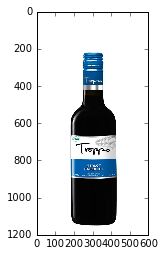

In [23]:
plt.imshow(Image.open('./pics/' + os.listdir('./pics/')[0]))

Obtained dataset contains 1504 uniform bottles images with same size 600x1200 and white background. Note that previous dataframe  has 25k drinks. Such drastic data size reduction may be explained by wrong category translation to swedish and by missed images for most beverages.

# Feature selection

In order to find unusual bottles I will apply clustering techniques. For that purpose we will a features construction method.
I guess that vector of widths on different levels will be a good feature.

In [24]:
%%time
import cv2

#get widths for features_dim linear segments
features_dim = 20
def get_width_features(im, fdim):
    features = []
    for rind in np.linspace(0, len(im)-1, fdim):
        row = im[rind]
        if len(row) == len(np.nonzero(row == 255)[0]):
            features.append(0.)
        else:
            ind1 = np.nonzero(row == 0)[0][0]
            ind2 = np.nonzero(row == 0)[0][-1]
            features.append(float(ind2-ind1))
    return features

data = []

for fname in os.listdir('./pics'):
    image = cv2.imread('./pics/' + fname)
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blur_im = cv2.blur(gray_image, (6,6))
    thresh = 250
    im_bw = cv2.threshold(blur_im, thresh, 255, cv2.THRESH_BINARY)[1]
    fs = get_width_features(im_bw, features_dim)
    data.append((fname, fs))

Wall time: 19.7 s


In [25]:
pddata = [{'image' : l[0], 'fvector' : l[1]} for l in data]

In [26]:
#create new small dataframe
df = pd.DataFrame(pddata)

In [27]:
df[0:5]

,fvector,image
0,"[0.0, 0.0, 0.0, 0.0, 108.0, 116.0, 112.0, 112....",1003_Troppo.jpg
1,"[0.0, 0.0, 0.0, 0.0, 0.0, 109.0, 118.0, 133.0,...",10083_Sierra_Nevada.jpg
2,"[0.0, 112.0, 114.0, 113.0, 114.0, 121.0, 171.0...",1015_Fox_Creek.jpg
3,"[0.0, 0.0, 109.0, 105.0, 106.0, 114.0, 139.0, ...",1026_Jacobsdal.jpg
4,"[0.0, 0.0, 0.0, 0.0, 0.0, 120.0, 118.0, 127.0,...",10271_Lindemans_Apple.jpg


In [28]:
#features array
vs = np.array(df['fvector'].values.tolist())

Check feature histograms:

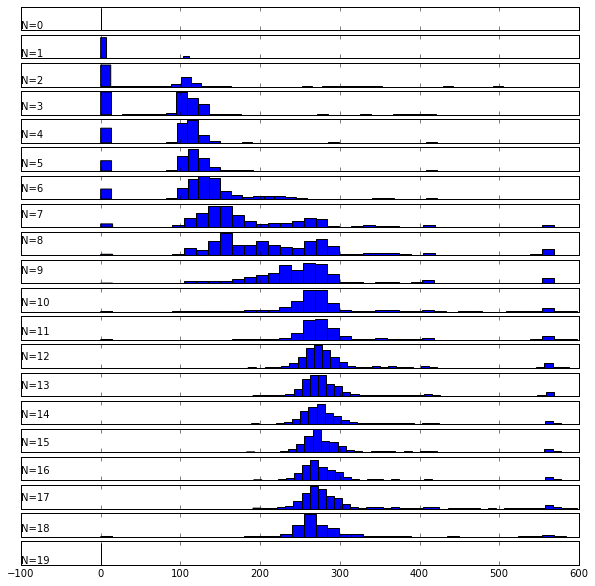

In [29]:
fig, axes = plt.subplots(figsize=[10, 0.5*20], ncols = 1, nrows = features_dim, sharex=True)
for ind in range(features_dim):
    ax = axes[ind]
    ax.hist(vs[:, ind], bins=40)
    ax.set_yticks([])
    ax.text(-100, 100, 'N={}'.format(ind))
plt.show()

First step of analysis is to check farthest bottles from center: 

In [30]:
vectors_mean = vs.sum(axis=0)/len(vs)

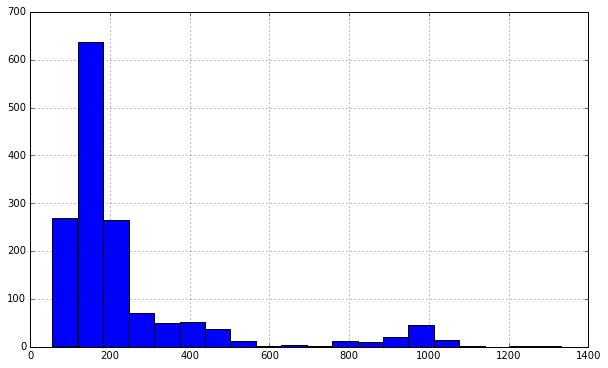

In [31]:
w = [distance.euclidean(l, vectors_mean) for l in vs]
fig = plt.figure(figsize=[10,6])
plt.hist(w, bins=20)
plt.grid()
plt.show()

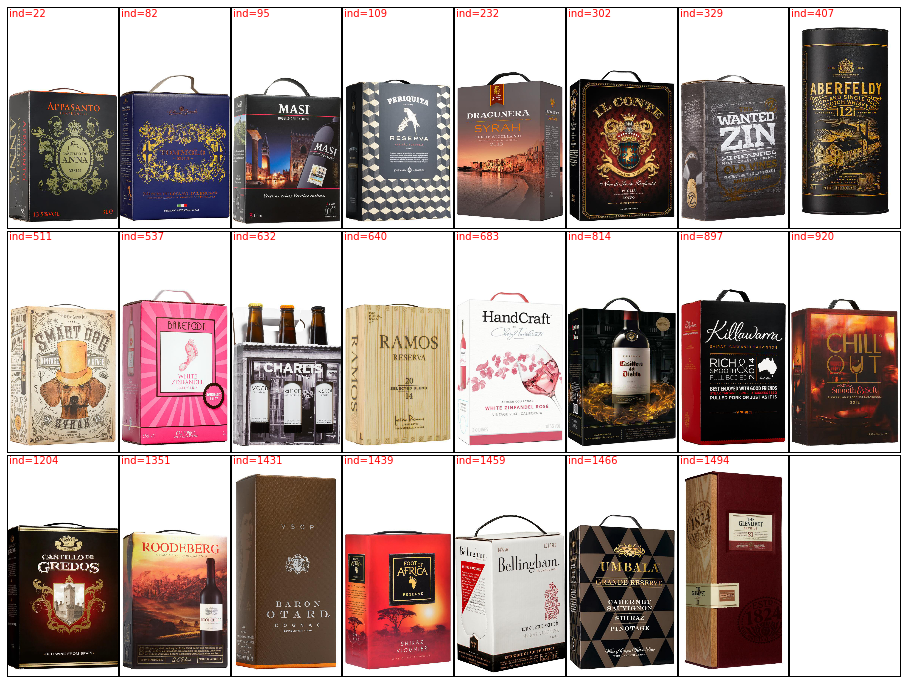

In [32]:
def plot_images_from_indexes(indexes, indicator=None):
    number = len(indexes)
    subsample = np.sort(indexes)
    rows = (number-1) / 8 + 1
    cols = min(8, number)
    
    if number <= 8:
        n8 = cols
    else:
        n8 = number
        if number%8 != 0:
            n8 = n8 + 8 - (number%8)
            
    fig, axes = plt.subplots(figsize=(16, 4*rows), ncols = cols, nrows = rows)
    fig.subplots_adjust(hspace=.01, wspace=.01)
    for i in range(n8):
        if axes.ndim == 2:
            ax = axes[i/cols][i%8]
        else:
            ax = axes[i%8]
        if i >= number:
            ax.imshow(np.ones(1200*600).reshape(1200, 600), cmap='gray',vmin=0,vmax=1)
        else:
            ind = subsample[i]
            ax.imshow(Image.open('./pics/' + df.ix[ind]['image']))
            if 'dist' in df.columns:
                ax.text(10., 100., 'dist={:.2f}'.format(df.ix[ind]['dist']))
            if 'cluster_n' in df.columns:
                ax.text(10., 150., 'cl={}'.format(df.ix[ind]['cluster_n']), color='blue')
            if indicator:
                ax.plot([560], [40], 's', color=indicator, markersize=10.)
                ax.set_xlim(0, 600)
                ax.set_ylim(1200, 0)
            ax.text(10., 50., 'ind={}'.format(ind), color='red')
        ax.set_xticks([])
        ax.set_yticks([])
        
#further than 1000 from center
indexes = []
for ind, dist in enumerate(w):
    if dist > 1000:
        indexes.append(ind)

plot_images_from_indexes(indexes)

It is easy to see that pictures are similar and aren't represent pecularities. Let's try apply analysis again for cosine distance: 

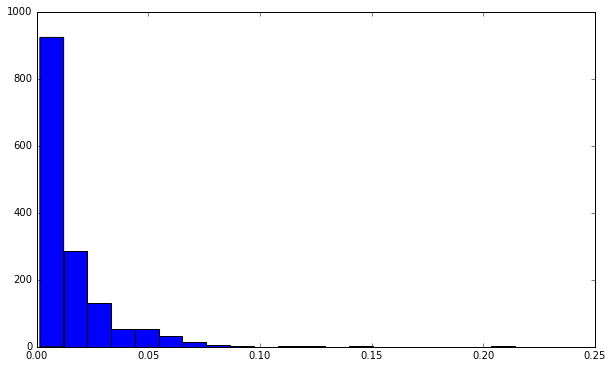

In [33]:
w = [distance.cosine(l, vectors_mean) for l in vs]
fig = plt.figure(figsize=[10,6])
plt.hist(w, bins=20)
plt.show()

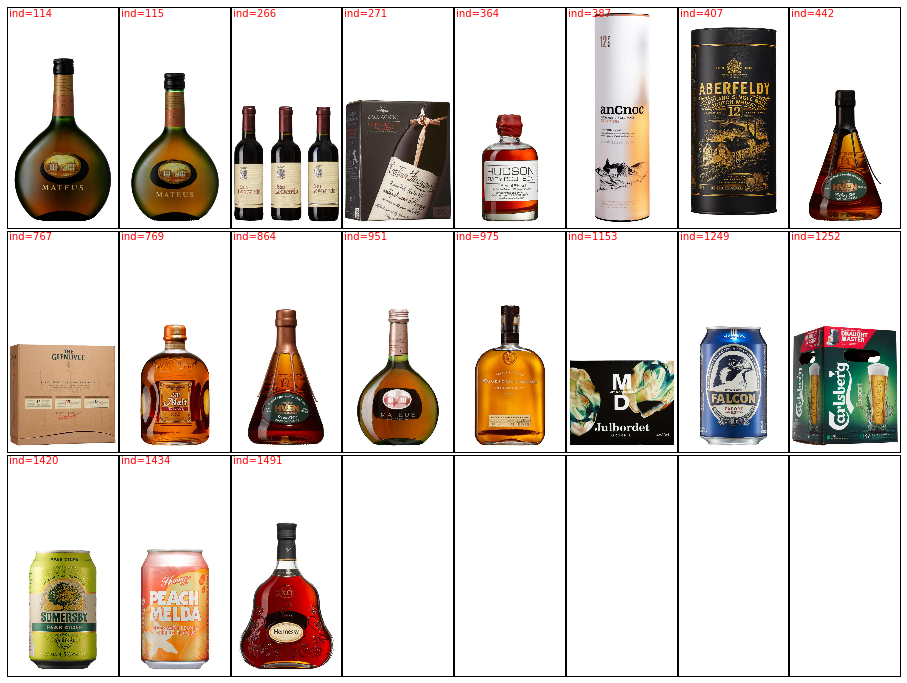

In [34]:
#further than 1000 from center
indexes = []
for ind, dist in enumerate(w):
    if dist > 0.07:
        indexes.append(ind)

plot_images_from_indexes(indexes)

This picture is very promising, we can see some pecularities here. But obviously that analysis step is too simple for real business. Next step a little harder: I try to apply simplest clustering method, called 'k-means'.

# K-means

In [35]:
from scipy.cluster.vq import *

In order to estimate number of centroids I measure mean standard deviation and mean squared error for different $k$ (elbow method).

In [36]:
%%time
k_stds = []
k_mses = []
centroids = []
N = 10

for k in range(2, 30):
    accum_std = 0
    accum_mse = 0
    for attempt in range(N):
        while len(centroids) != k: # strange, but it's not always true that k == len(centroids)  
            centroids, _ = kmeans(vs, k, iter=30)
            idx,_ = vq(vs, centroids)
        for c in range(0, k):
            k_std = np.std([distance.euclidean(l, centroids[c]) for l in vs[idx == c]])
            accum_std += k_std
            k_mse = np.power([distance.euclidean(l, centroids[c]) for l in vs[idx == c]], 2).sum()
            accum_mse += k_mse
    k_stds.append((k, accum_std / ((k-1)*N)))
    k_mses.append((k, accum_mse / ((k-1)*N)))

Wall time: 24.2 s


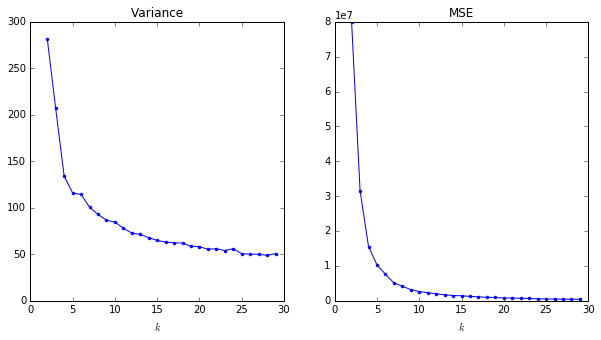

In [37]:
fig, axes = plt.subplots(figsize=[10, 5], ncols=2, nrows=1)
k_stds = np.array(k_stds)
axes[0].plot(k_stds[:,0], k_stds[:,1], '.-')
axes[0].set_title('Variance')
axes[0].set_xlabel('$k$')
k_mses = np.array(k_mses)
axes[1].plot(k_mses[:,0], k_mses[:,1], '.-')
axes[1].set_title('MSE')
axes[1].set_xlabel('$k$')
plt.show()

From variance we have elbow for $k=5$ and from $MSE$ we have probably $k=7$. I prefer $k=7$. 

Then I will apply k-means and look on clusters: 

In [38]:
k = 7
centroids, _ = kmeans(vs, k)
labels,_ = vq(vs, centroids)
df['cluster_n'] = labels
df[0:3]

,fvector,image,cluster_n
0,"[0.0, 0.0, 0.0, 0.0, 108.0, 116.0, 112.0, 112....",1003_Troppo.jpg,4
1,"[0.0, 0.0, 0.0, 0.0, 0.0, 109.0, 118.0, 133.0,...",10083_Sierra_Nevada.jpg,5
2,"[0.0, 112.0, 114.0, 113.0, 114.0, 121.0, 171.0...",1015_Fox_Creek.jpg,2


In [39]:
print df.groupby('cluster_n').describe()

                                              image
cluster_n                                          
0         count                                  81
          unique                                 81
          top                    1128_Chill_Out.jpg
          freq                                    1
1         count                                 440
          unique                                440
          top     24340_Thornbridge_Oktoberfest.jpg
          freq                                    1
2         count                                 224
          unique                                224
          top                   24366_Woodstock.jpg
          freq                                    1
3         count                                  77
          unique                                 77
          top           381_Carlsberg_Sort_Guld.jpg
          freq                                    1
4         count                                 471
          un

So it seems like we have 2 massive, 2 mediocre and 3 small clusters.

In [40]:
#how far centroids from each other
centroids_dist_matrix = distance.cdist(centroids,centroids,'euclidean')
pd.DataFrame(centroids_dist_matrix)

,0,1,2,3,4,5,6
0,0.000000,995.059775,990.687069,643.912286,1064.868012,1065.626846,955.196662
1,995.059775,0.000000,149.292481,371.631805,137.896530,265.346396,770.811672
2,990.687069,149.292481,0.000000,386.963962,239.908282,364.620486,713.351632
3,643.912286,371.631805,386.963962,0.000000,432.516326,465.013750,718.434746
4,1064.868012,137.896530,239.908282,432.516326,0.000000,191.036102,860.391904
5,1065.626846,265.346396,364.620486,465.013750,191.036102,0.000000,994.321391
6,955.196662,770.811672,713.351632,718.434746,860.391904,994.321391,0.000000


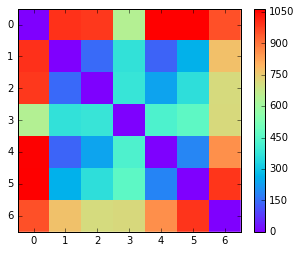

In [41]:
im = plt.imshow(centroids_dist_matrix, cmap='rainbow', interpolation='none')
plt.colorbar(im, fraction=0.046, pad=0.04)
plt.show()

This pairs (2,5), (2,6), (4,5), (4,6), (5,6) are near two each other and possibly demonstrate similar shapes.
Let's see now which bottles represent which cluster and plot euclidian distances to cluster's centroid histogram: 

In [42]:
df['dist'] = [distance.euclidean(centroids[l[1]['cluster_n']], l[1]['fvector']) for l in df.iterrows()]

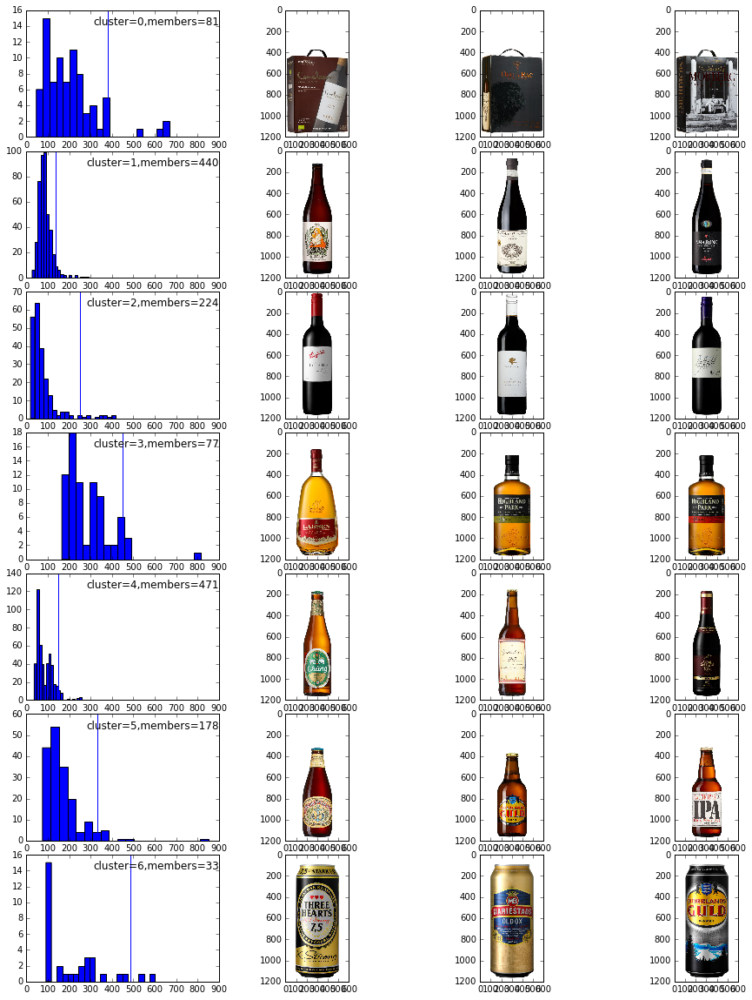

In [43]:
fig, axes = plt.subplots(figsize=(16, 20), ncols = 4, nrows = k)
fig.subplots_adjust(hspace=.11, wspace=.01)
for cl in range(k):
    incluster_distances = df[df['cluster_n'] == cl]['dist'].tolist()
    ax = axes[cl]
    ax[0].hist(incluster_distances, bins=20)
    ax[0].set_title('cluster={},members={}'.format(cl, len(incluster_distances)), y=0.85, loc='right')
    q95 = np.percentile(incluster_distances, 95)
    ax[0].axvline(x=q95)
    ax[0].set_xlim(0, 900)
    
    ddd = df.groupby('cluster_n')['dist'].nsmallest(3)
    for ind, val in np.ndenumerate(ddd[cl].index.values):
        ax[ind[0]+1].imshow(Image.open('./pics/' + df.ix[val]['image'])) 
    
plt.show()

Now we can see why mentioned clusters have close distances. Let's see outliers on boxplot:  

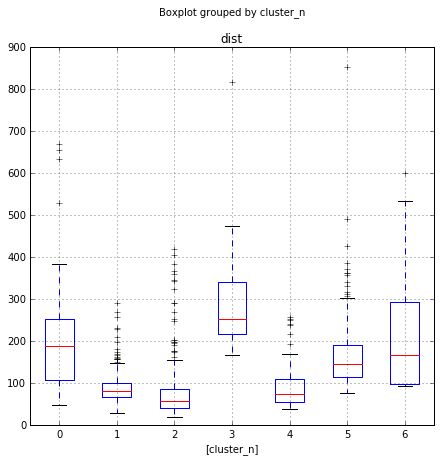

In [44]:
fig = plt.figure(figsize=[7,7])
ax = fig.add_subplot(111)
bp = df[['dist', 'cluster_n']].boxplot(by='cluster_n', ax=ax)

Examine bottles more carefully:

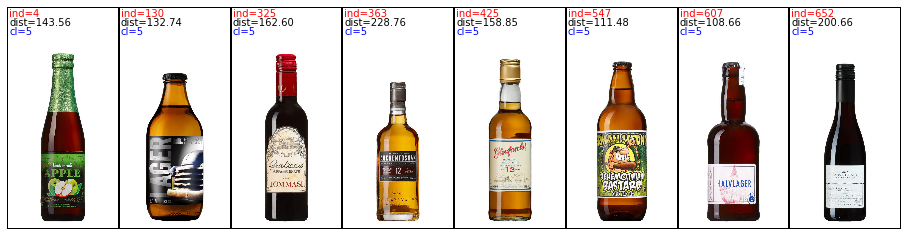

In [45]:
def plot_random_cluster_members(cluster, number=8):
    cluster_members = df[df['cluster_n'] == cluster].index.values
    subsample = np.random.choice(cluster_members, size=min(number, len(cluster_members)), replace=False)
    plot_images_from_indexes(subsample)
    
plot_random_cluster_members(cluster=5, number=8)
plt.show()

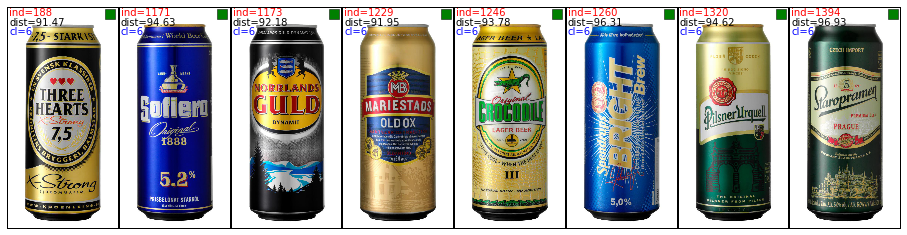

In [46]:
def plot_good_cluster_members(cluster, number=8):
    ddd = df.groupby('cluster_n')['dist'].nsmallest(number)
    plot_images_from_indexes(ddd[cl].index.values, indicator='green')
    
plot_good_cluster_members(cluster=5, number=8)
plt.show()

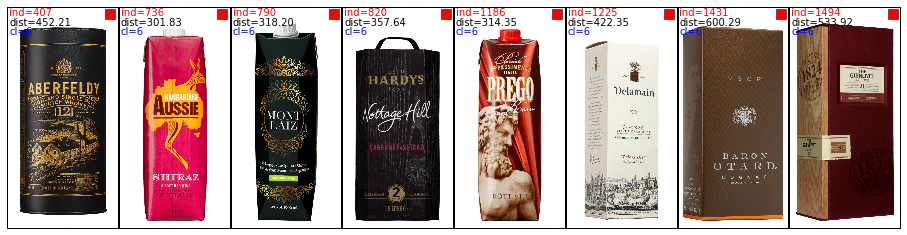

In [47]:
def plot_bad_cluster_members(cluster, number=8):
    ddd = df.groupby('cluster_n')['dist'].nlargest(number)
    plot_images_from_indexes(ddd[cl].index.values, indicator='red')
    
plot_bad_cluster_members(cluster=5, number=8)
plt.show()

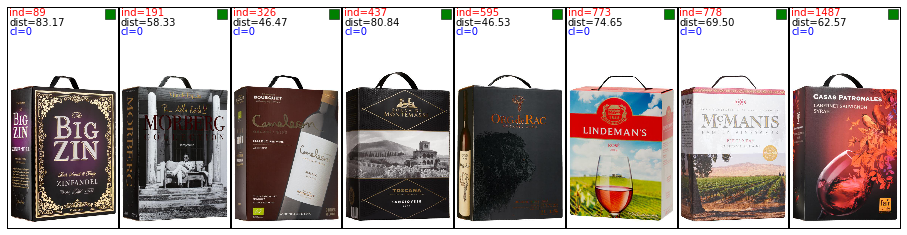

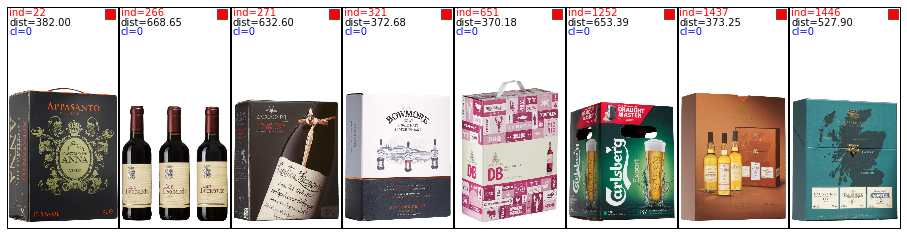

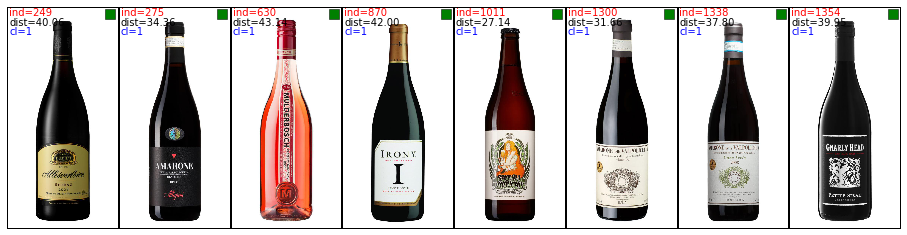

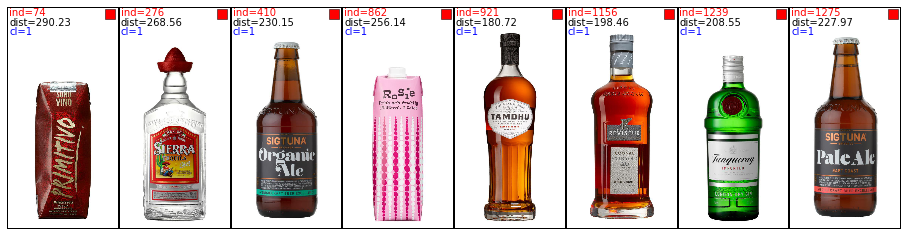

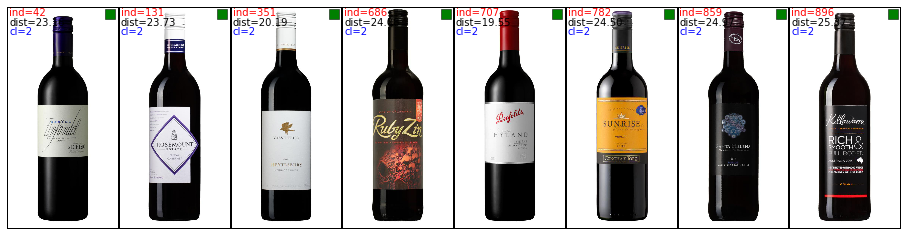

...

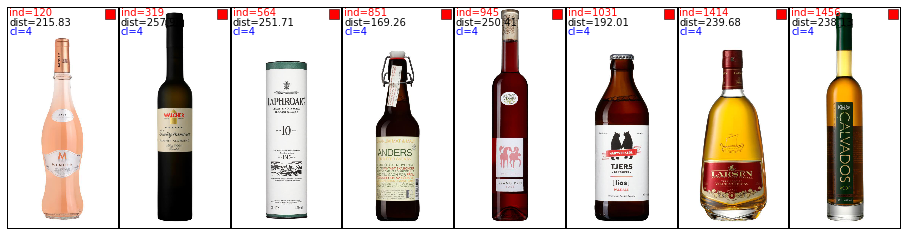

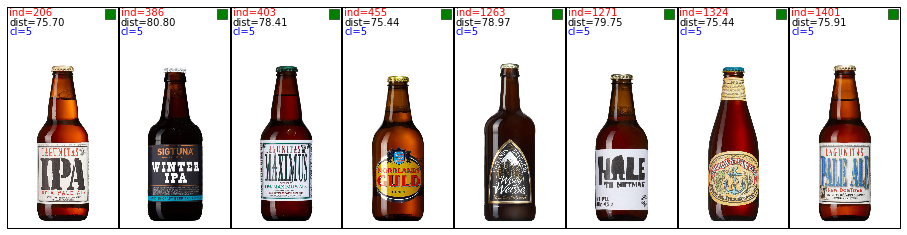

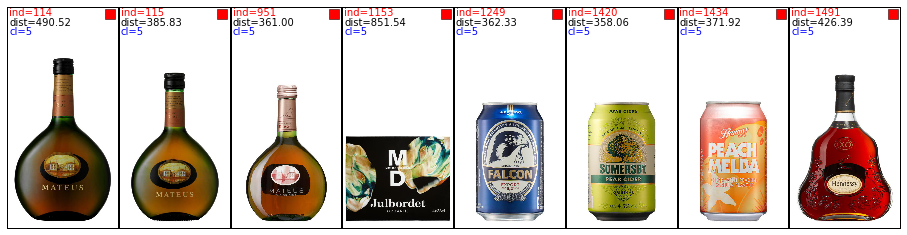

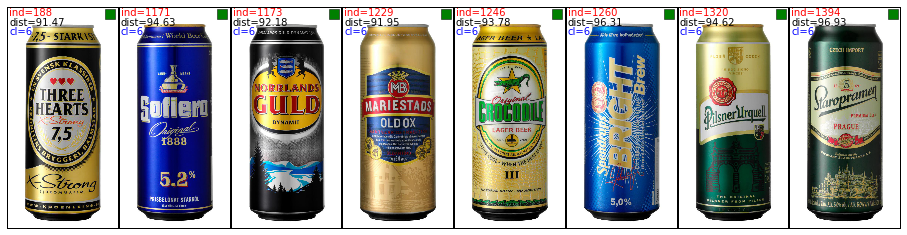

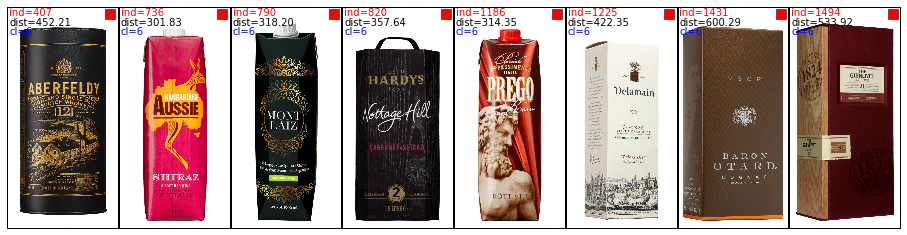

In [48]:
for cl in range(k):
    plot_good_cluster_members(cluster=cl, number=8)
    plot_bad_cluster_members(cluster=cl, number=8)
plt.show()

On this pictures some pecularities may be found (mostly in 2-6 clusters), but it is hard to determine them. As expected we can't find unusual bottles in clear way because selected features not able to show them and k-mean's nature also not good in this task. Let's now try another clustering technique.  

# DBSCAN

In [49]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets.samples_generator import make_blobs
from sklearn.preprocessing import StandardScaler


# Compute DBSCAN
db = DBSCAN(eps=20.3, min_samples=10).fit(vs)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of clusters: %d' % n_clusters_)

Estimated number of clusters: 15


Again, find elbow:

In [50]:
%%time

eps_range = np.arange(0.1, 250., 1.) 
dbscan_clusters = [[],[],[],[]]
cl_min_samples = [10, 20, 50, 100]
for eps in eps_range:
    for ind, cl_min_s in enumerate(cl_min_samples):
        db = DBSCAN(eps=eps, min_samples=cl_min_s).fit(vs)
        labels = db.labels_
        n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
        dbscan_clusters[ind].append((n_clusters_, labels.tolist().count(-1)))

Wall time: 2min 50s


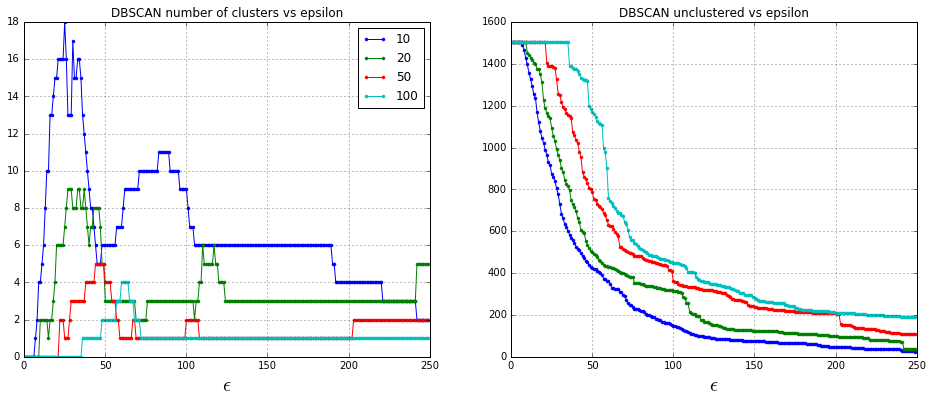

In [51]:
fig, axes = plt.subplots(figsize=[16,6], ncols=2, nrows=1)
for ind, cl_min_s in enumerate(cl_min_samples):
    axes[0].plot(eps_range, zip(*dbscan_clusters[ind])[0], '.-', label='{}'.format(cl_min_s))
    axes[1].plot(eps_range, zip(*dbscan_clusters[ind])[1], '.-', label='{}'.format(cl_min_s))

axes[0].set_xlabel('$\epsilon$', fontsize=20.)
axes[1].set_xlabel('$\epsilon$', fontsize=20.)
axes[0].set_title('DBSCAN number of clusters vs epsilon')
axes[1].set_title('DBSCAN unclustered vs epsilon')
axes[0].grid()
axes[1].grid()
axes[0].legend()
plt.show()

I choose $\epsilon=100$ and min sample size equal 10. 

In [52]:
db = DBSCAN(eps=100., min_samples=10).fit(vs)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of clusters: %d' % n_clusters)

Estimated number of clusters: 9


In [53]:
#number of nonclustered
labels.tolist().count(-1)

148

In [54]:
unclass = np.arange(len(labels))[labels == -1]

#plot 148 images
# plot_images_from_indexes(unclass)

Now it's time to understand, what am I looking for. I take a look at this ~150 images and manually select some among them with pecularities in shape. 

In [55]:
manually_collected = [266, 503, 1268, 1491, 65, 341, 442, 102, 681, 1452, 333, 346, 364, 1153, 1456, 766, 576,
                      366, 340, 864, 120, 1362, 1144, 703, 599, 976, 114, 528, 336, 1239, 702, 276, 411, 566,
                      558, 951, 423, 975, 115, 1413, 1454, 469, 544, 1315, 1202, 1414, 769, 1156, 1207, 57, 921]
print len(manually_collected)

51


I also try to perform DBSCAN and kmeans on nonclustered images, but not found anything valuable.

# Another features, v1.0

I decide to perform analysis on different features, which are
* max width
* height
* volume
* alcohol

In [56]:
%%time

features_dim = 1200
data = []

for fname in os.listdir('./pics'):
    image = cv2.imread('./pics/' + fname)
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blur_im = cv2.blur(gray_image, (6,6))
    thresh = 250
    im_bw = cv2.threshold(blur_im, thresh, 255, cv2.THRESH_BINARY)[1]
    fs = get_width_features(im_bw, features_dim)
    data.append((fname, max(fs), sum(e > 0 for e in fs)))

Wall time: 2min 11s


Start with width and height and plot them on 2D plane with what was manually selected previously.

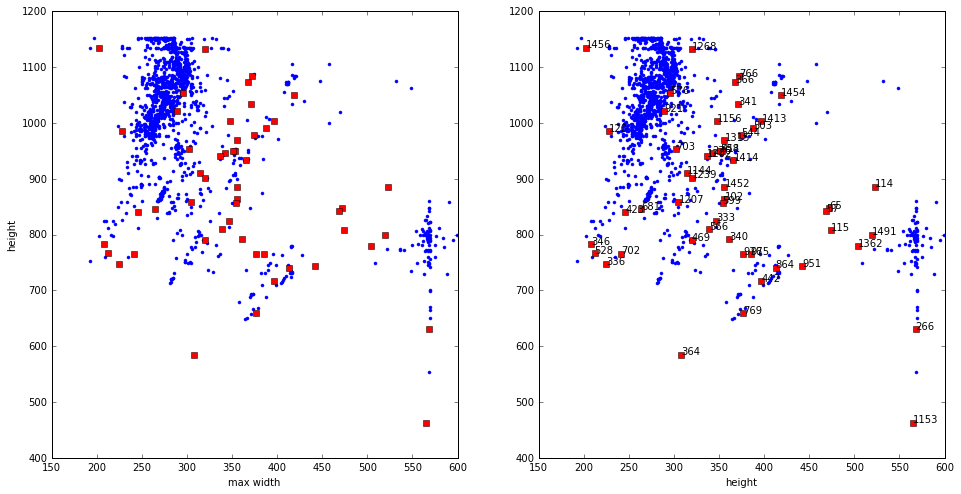

In [57]:
wdata = np.array(zip(*data)[1])
hdata = np.array(zip(*data)[2])
fig, (ax1, ax2) = plt.subplots(figsize=[16, 8], ncols=2, nrows=1)
ax1.plot(wdata, hdata, '.')
ax1.plot(wdata[manually_collected], hdata[manually_collected], 's', color='red')
ax2.plot(wdata, hdata, '.')
ax2.plot(wdata[manually_collected], hdata[manually_collected], 's', color='red')
for ind, xy in enumerate(zip(wdata[manually_collected], hdata[manually_collected])):
    ax2.annotate('%s' % manually_collected[ind], xy=xy, textcoords='data')
ax1.set_xlabel('max width')
ax2.set_xlabel('max width')
ax1.set_ylabel('height')
ax2.set_xlabel('height')
plt.show()

As it seen from the plot, there is no clear way to extract reds.

In [58]:
vs = zip(wdata, hdata)

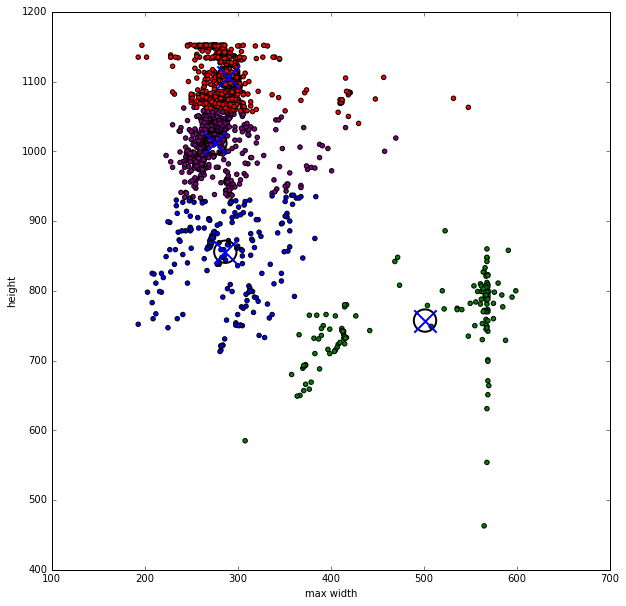

In [59]:
from matplotlib.colors import ListedColormap

#run k-mean; poor result
centroids, labels = kmeans(zip(wdata, hdata), 4)
idx,_ = vq(zip(wdata, hdata), centroids)
colors = ['red','green','blue','purple']

fig = plt.figure(figsize=[10,10])
plt.scatter(wdata, hdata, c=idx, cmap=ListedColormap(colors))
plt.scatter(centroids[:,0], centroids[:,1], marker='o', s = 500, linewidths=2, c='none')
plt.scatter(centroids[:,0],centroids[:,1], marker='x', s = 500, linewidths=2)
plt.xlabel('max width')
plt.ylabel('height')
plt.show()

Another attempt to run DBSCAN

In [60]:
%%time

eps_range = np.arange(0.1, 250., 1.) 
dbscan_clusters = [[],[],[],[]]
cl_min_samples = [10, 20, 50, 100]
for eps in eps_range:
    for ind, cl_min_s in enumerate(cl_min_samples):
        db = DBSCAN(eps=eps, min_samples=cl_min_s).fit(vs)
        labels = db.labels_
        n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
        dbscan_clusters[ind].append((n_clusters_, labels.tolist().count(-1)))

Wall time: 44.8 s


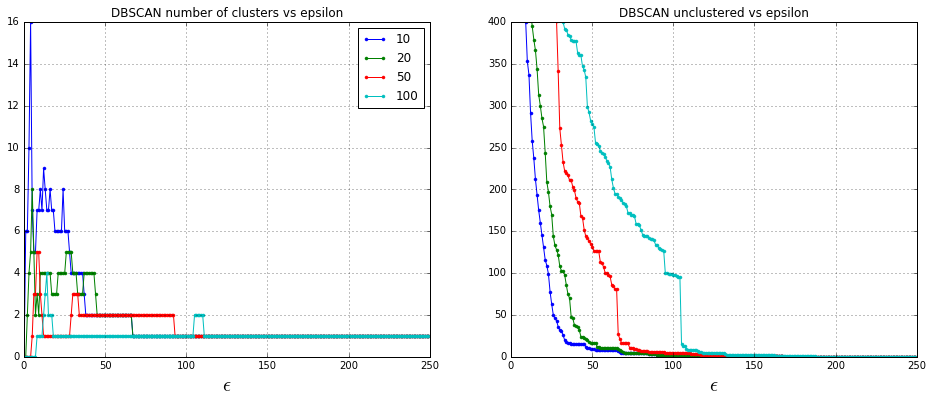

In [61]:
fig, axes = plt.subplots(figsize=[16,6], ncols=2, nrows=1)
for ind, cl_min_s in enumerate(cl_min_samples):
    axes[0].plot(eps_range, zip(*dbscan_clusters[ind])[0], '.-', label='{}'.format(cl_min_s))
    axes[1].plot(eps_range, zip(*dbscan_clusters[ind])[1], '.-', label='{}'.format(cl_min_s))

axes[0].set_xlabel('$\epsilon$', fontsize=20.)
axes[1].set_xlabel('$\epsilon$', fontsize=20.)
axes[0].set_title('DBSCAN number of clusters vs epsilon')
axes[1].set_title('DBSCAN unclustered vs epsilon')
axes[0].grid()
axes[1].grid()
axes[0].legend()
axes[1].set_ylim(0, 400)
plt.show()

In [62]:
df = df.drop('dist', 1)
df = df.drop('fvector', 1)
df = df.drop('cluster_n', 1)

Choose 2 clusters and 9 nonclustered, results are not bad in precision, but don't show good recall.

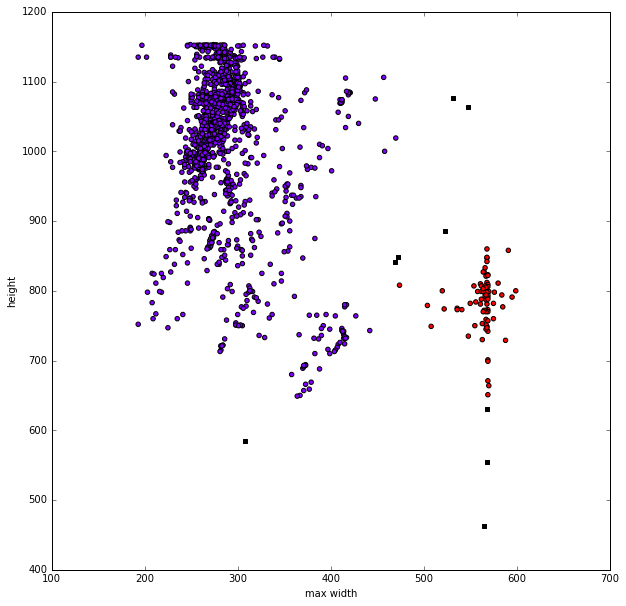

In [63]:
db = DBSCAN(eps=50., min_samples=10).fit(vs)
idx = db.labels_
n_clusters = len(set(idx)) - (1 if -1 in idx else 0)
colors=plt.cm.rainbow(np.linspace(0, 1, n_clusters))

real_clusters = idx > -1

fig = plt.figure(figsize=[10,10])
plt.scatter(wdata[real_clusters], hdata[real_clusters], c=idx[real_clusters], cmap=ListedColormap(colors))
plt.scatter(wdata[~real_clusters], hdata[~real_clusters], marker='s', color='black')
plt.xlabel('max width')
plt.ylabel('height')
plt.show()

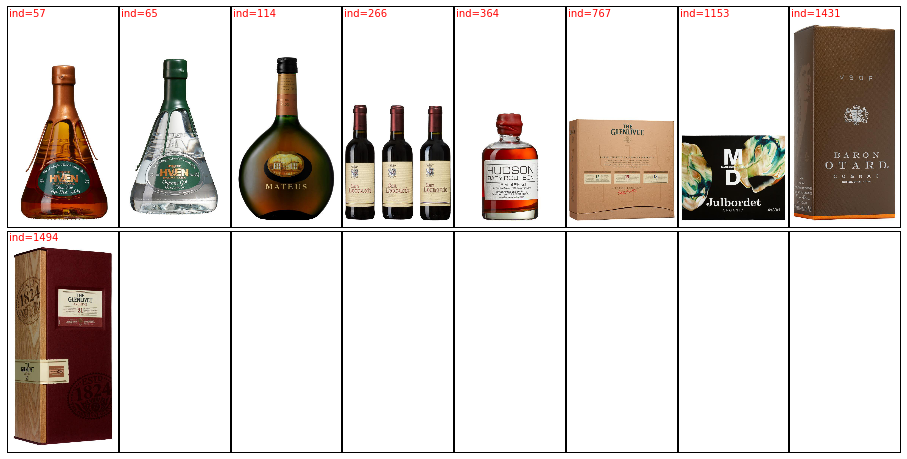

In [64]:
plot_images_from_indexes(np.arange(len(labels))[~real_clusters])

Now let's examine only ~150 nonclustered previously images (blue dots show manually selected, e.g. 'good' bottles). 

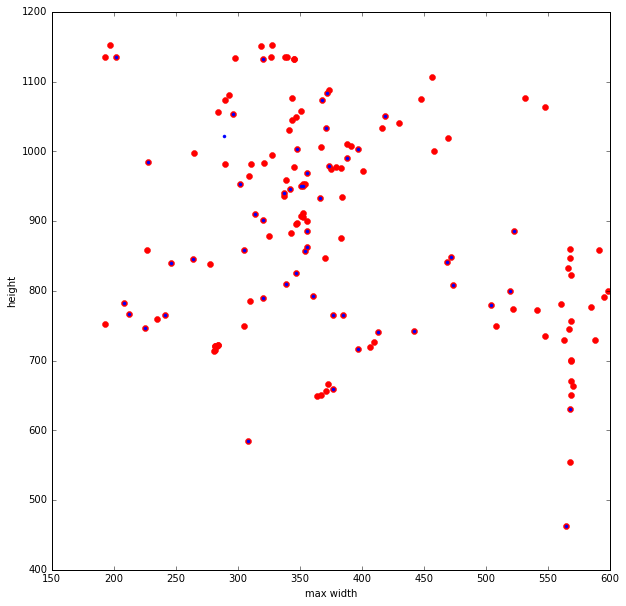

In [65]:
fig = plt.figure(figsize=[10, 10])
plt.plot(wdata[unclass], hdata[unclass], '.', ms=12., color='red')
plt.plot(wdata[manually_collected], hdata[manually_collected], '.', color='blue', ms=6.)
plt.xlabel('max width')
plt.ylabel('height')
plt.show()

DBSCAN for them too:

In [66]:
vs = zip(wdata[unclass], hdata[unclass])

In [67]:
%%time

eps_range = np.arange(0.1, 250., 1.) 
dbscan_clusters = [[],[],[],[]]
cl_min_samples = [10, 20, 50, 100]
for eps in eps_range:
    for ind, cl_min_s in enumerate(cl_min_samples):
        db = DBSCAN(eps=eps, min_samples=cl_min_s).fit(vs)
        labels = db.labels_
        n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
        dbscan_clusters[ind].append((n_clusters_, labels.tolist().count(-1)))

Wall time: 1.45 s


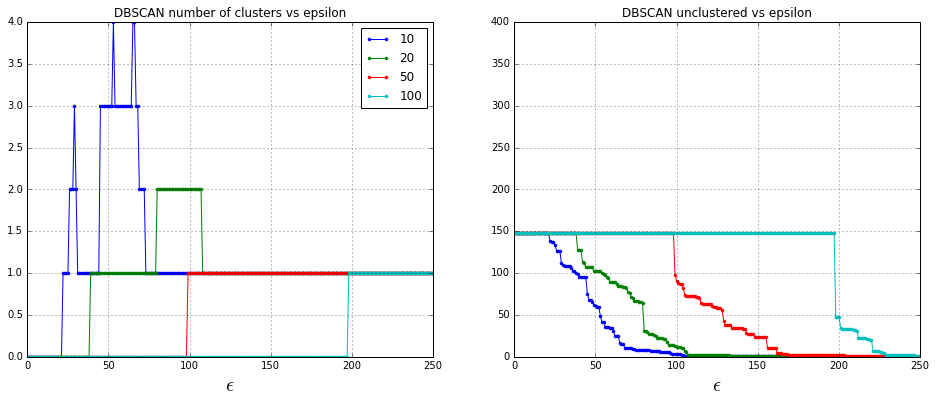

In [68]:
fig, axes = plt.subplots(figsize=[16,6], ncols=2, nrows=1)
for ind, cl_min_s in enumerate(cl_min_samples):
    axes[0].plot(eps_range, zip(*dbscan_clusters[ind])[0], '.-', label='{}'.format(cl_min_s))
    axes[1].plot(eps_range, zip(*dbscan_clusters[ind])[1], '.-', label='{}'.format(cl_min_s))

axes[0].set_xlabel('$\epsilon$', fontsize=20.)
axes[1].set_xlabel('$\epsilon$', fontsize=20.)
axes[0].set_title('DBSCAN number of clusters vs epsilon')
axes[1].set_title('DBSCAN unclustered vs epsilon')
axes[0].grid()
axes[1].grid()
axes[0].legend()
axes[1].set_ylim(0, 400)
plt.show()

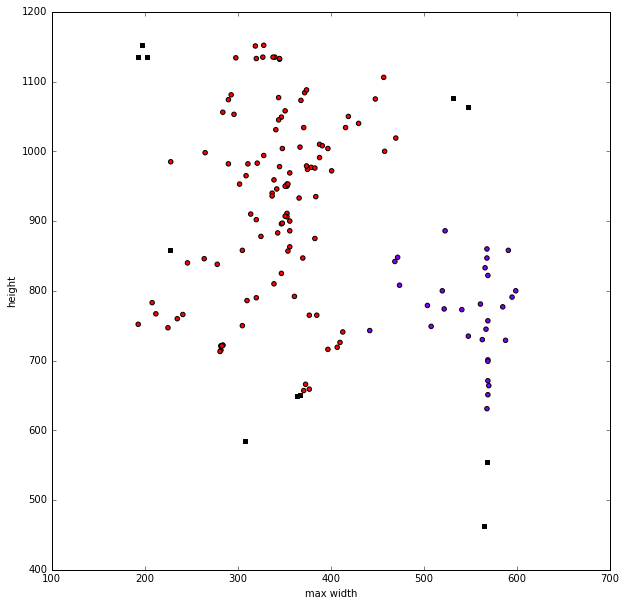

In [69]:
db = DBSCAN(eps=70., min_samples=10).fit(vs)
idx = db.labels_
n_clusters = len(set(idx)) - (1 if -1 in idx else 0)
colors=plt.cm.rainbow(np.linspace(0, 1, n_clusters))

real_clusters = idx > -1

fig = plt.figure(figsize=[10,10])
plt.scatter(wdata[unclass][real_clusters], hdata[unclass][real_clusters], c=idx[real_clusters], cmap=ListedColormap(colors))
plt.scatter(wdata[unclass][~real_clusters], hdata[unclass][~real_clusters], marker='s', color='black')
plt.xlabel('max width')
plt.ylabel('height')
plt.show()

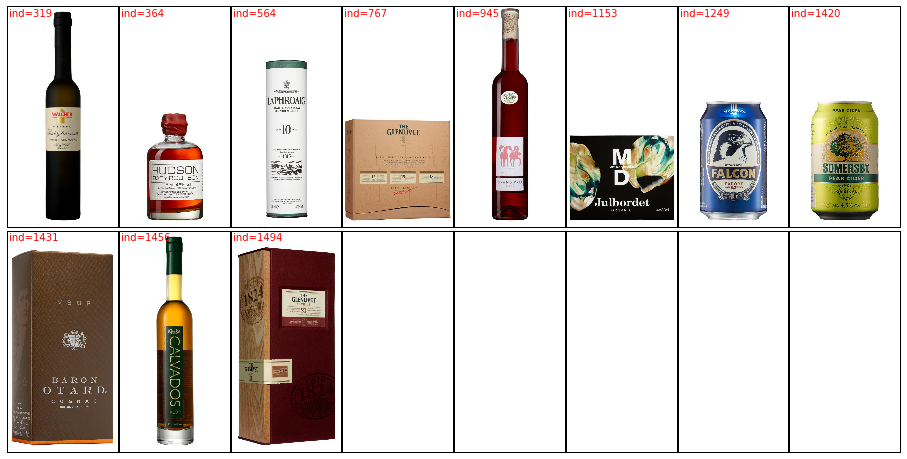

In [70]:
plot_images_from_indexes(np.arange(len(wdata))[unclass][~real_clusters])

Meaningless(

# Another features, v2.0

Last analysis step will include volume and alcohol into our (width, height) data. 

In [71]:
#needed for original sdf index finding
def get_index_from_image(imgname):
    return int(imgname[0:imgname.index('_')])

print get_index_from_image('1003_Troppo.jpg')

1003


In [72]:
img_ind = df['image'].apply(get_index_from_image).values
df['original_index'] = img_ind
df['volume'] = sdf.iloc[img_ind]['volume'].values #get data from original sdf dataframe
df['alcohol'] = sdf.iloc[img_ind]['alcohol'].values
df['max_width'] = wdata
df['height'] = hdata

In [73]:
df[0:3]

,image,original_index,volume,alcohol,max_width,height
0,1003_Troppo.jpg,1003,0.38,0.14,252,935
1,10083_Sierra_Nevada.jpg,10083,0.35,0.06,285,859
2,1015_Fox_Creek.jpg,1015,0.75,0.15,288,1126


Correlation matrix again

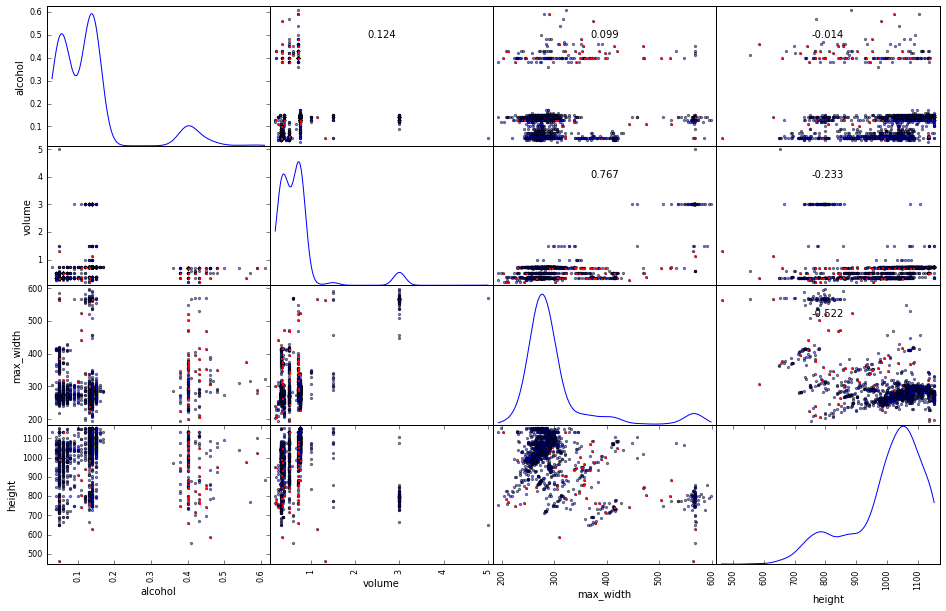

In [74]:
axes = pd.scatter_matrix(df[['alcohol', 'volume', 'max_width', 'height']], alpha=0.5, figsize=(16, 10), diagonal='kde')
corr = df[['alcohol', 'volume', 'max_width', 'height']].corr().as_matrix()
for i, j in zip(*plt.np.triu_indices_from(axes, k=1)):
    axes[i, j].annotate("%.3f" %corr[i,j], (0.5, 0.8), xycoords='axes fraction', ha='center', va='center')

for ind1, c1 in enumerate(['alcohol', 'volume', 'max_width', 'height']):
    for ind2, c2 in enumerate(['alcohol', 'volume', 'max_width', 'height']):
        if c1 == c2:
            pass
        else:
            ax = axes[ind2][ind1]
            ax.scatter(df[c1][manually_collected], df[c2][manually_collected], marker='s', color='red', s=1)

plt.show()

I see no clear evidence of features pair with reds isolation existance.

In [75]:
# select data
vs = df[['alcohol', 'volume', 'max_width', 'height']].values
vs = preprocessing.scale(vs)

In [76]:
%%time

eps_range = np.arange(0.1, 250., 1.) 
dbscan_clusters = [[],[],[],[]]
cl_min_samples = [10, 20, 50, 100]
for eps in eps_range:
    for ind, cl_min_s in enumerate(cl_min_samples):
        db = DBSCAN(eps=eps, min_samples=cl_min_s).fit(vs)
        labels = db.labels_
        n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
        dbscan_clusters[ind].append((n_clusters_, labels.tolist().count(-1)))

Wall time: 47.3 s


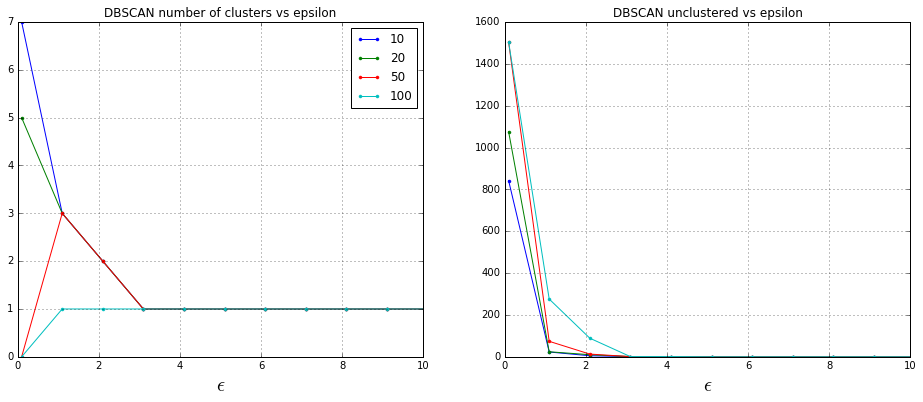

In [77]:
fig, axes = plt.subplots(figsize=[16,6], ncols=2, nrows=1)
for ind, cl_min_s in enumerate(cl_min_samples):
    axes[0].plot(eps_range, zip(*dbscan_clusters[ind])[0], '.-', label='{}'.format(cl_min_s))
    axes[1].plot(eps_range, zip(*dbscan_clusters[ind])[1], '.-', label='{}'.format(cl_min_s))

axes[0].set_xlabel('$\epsilon$', fontsize=20.)
axes[1].set_xlabel('$\epsilon$', fontsize=20.)
axes[0].set_title('DBSCAN number of clusters vs epsilon')
axes[1].set_title('DBSCAN unclustered vs epsilon')
axes[0].grid()
axes[1].grid()
axes[0].legend()
axes[0].set_xlim(0, 10)
axes[1].set_xlim(0, 10)
plt.show()

DBSCAN shows fast convergence and there is no real big difference in parameters selection.

Plot clusters on (width, height) plane:

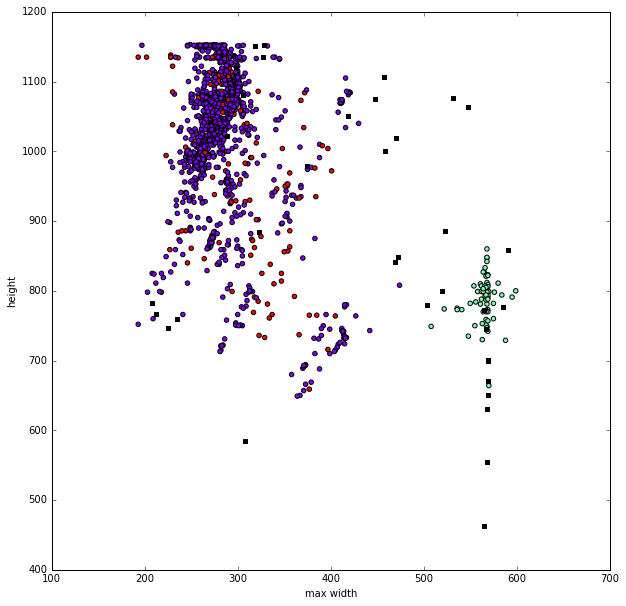

In [78]:
db = DBSCAN(eps=1., min_samples=20).fit(vs)
idx = db.labels_
n_clusters = len(set(idx)) - (1 if -1 in idx else 0)
colors=plt.cm.rainbow(np.linspace(0, 1, n_clusters))

real_clusters = idx > -1

fig = plt.figure(figsize=[10,10])
plt.scatter(wdata[real_clusters], hdata[real_clusters], c=idx[real_clusters], cmap=ListedColormap(colors))
plt.scatter(wdata[~real_clusters], hdata[~real_clusters], marker='s', color='black')
plt.xlabel('max width')
plt.ylabel('height')
plt.show()

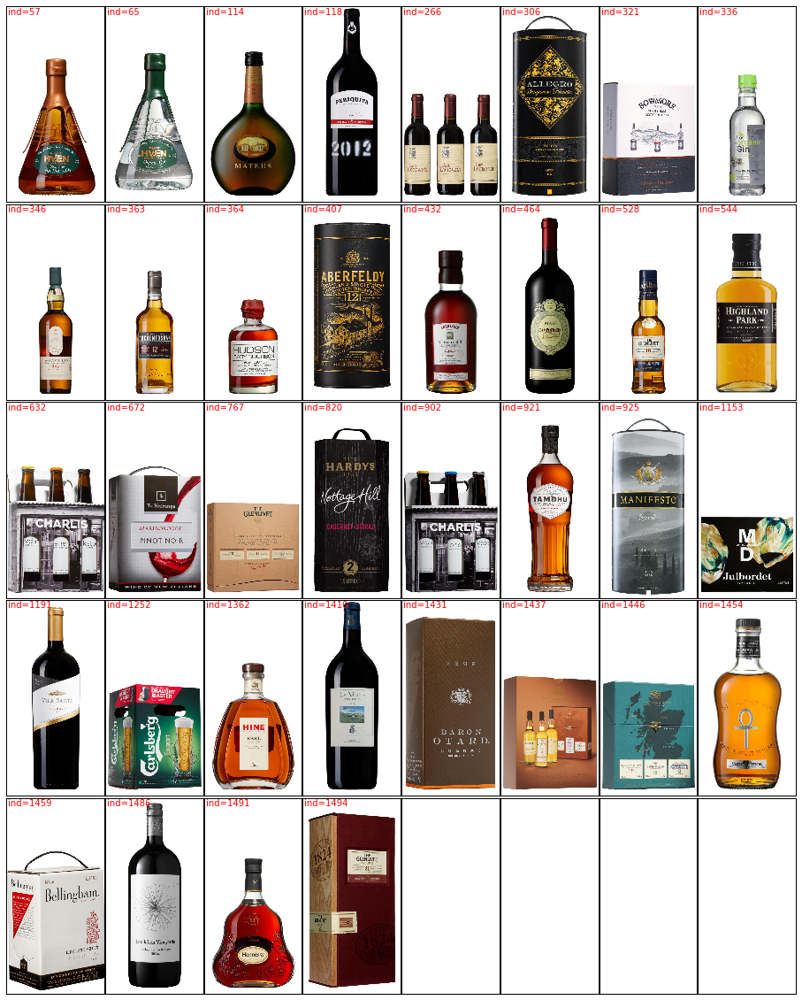

In [79]:
plot_images_from_indexes(np.arange(len(labels))[~real_clusters])

Not bad!

# Result

Here they are - our  manually selected bottles list:

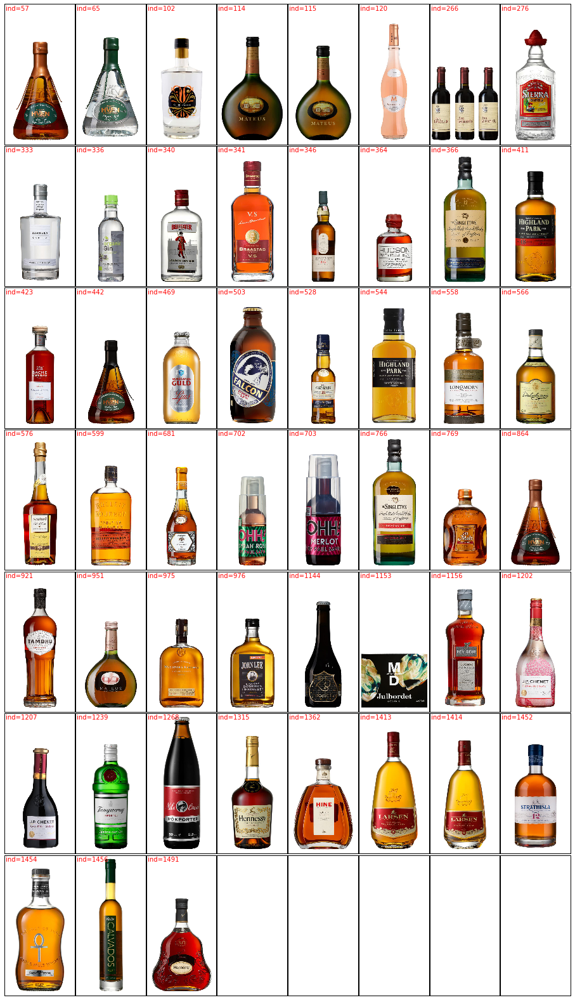

In [80]:
plot_images_from_indexes(manually_collected)